<a href="https://www.kaggle.com/code/lrntszab/vehicle-detection-detectron2?scriptVersionId=173572776" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Detectron2 Installation

In [1]:
import sys, os, distutils.core
from IPython.display import clear_output

!python -m pip install pyyaml==5.1
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))
clear_output()

# Importing

In [2]:
import torch, detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
print("detectron2 version:", detectron2.__version__)

import numpy as np
import os, json, cv2, random
from IPython import display
import PIL
import matplotlib.pyplot as plt

# importing detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog


SEED = 13
THRESHOLD = 0.75

detectron2 version: 0.6


# Register the custom dataset

In [3]:
from detectron2.data.datasets import register_coco_instances
from detectron2.structures import BoxMode

for d in ["train", "valid", "test"]:
    register_coco_instances(f"vehicles_{d}", {},
                            f"/kaggle/input/vehicle-detection-image-dataset/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/{d}/_annotations.coco.json",
                            f"/kaggle/input/vehicle-detection-image-dataset/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/{d}")

# Data inspection

WARNING [04/23 16:34:06 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/23 16:34:06 d2.data.datasets.coco]: Loaded 102 images in COCO format from /kaggle/input/vehicle-detection-image-dataset/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/train/_annotations.coco.json


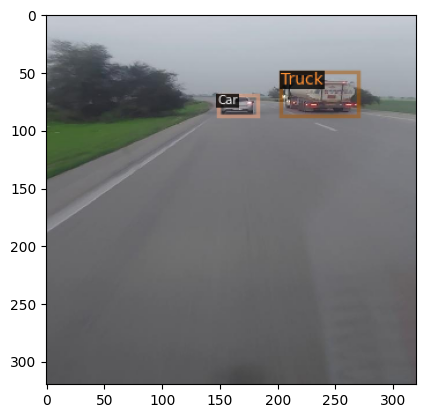

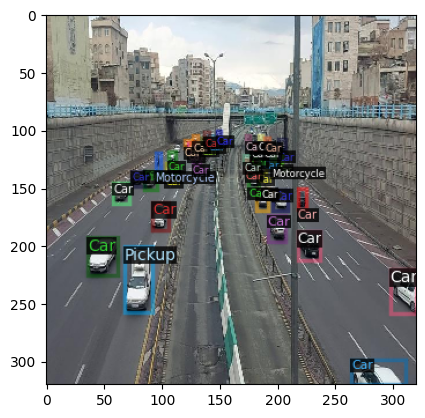

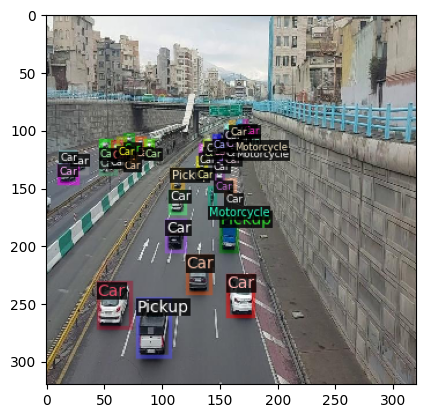

In [4]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("vehicles_train")
dataset_dicts = DatasetCatalog.get("vehicles_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    final_image = vis.get_image()
    imgplot = plt.imshow(final_image)
    plt.show()

# Training

In [5]:
from detectron2.engine import DefaultTrainer

EPOCHS = 500
BASE_LR = 0.001

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("vehicles_train")
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.DEVICE = "cuda:0"
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = BASE_LR  
cfg.SOLVER.MAX_ITER = EPOCHS    
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/23 16:34:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:02, 177MB/s]                           


[04/23 16:34:13 d2.engine.train_loop]: Starting training from iteration 0


/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[04/23 16:34:31 d2.utils.events]:  eta: 0:06:06  iter: 19  total_loss: 2.532  loss_cls: 1.782  loss_box_reg: 0.6293  loss_rpn_cls: 0.04615  loss_rpn_loc: 0.1624    time: 0.7284  last_time: 0.8108  data_time: 0.0104  last_data_time: 0.0054   lr: 3.8962e-05  max_mem: 3962M


2024-04-23 16:34:33.098651: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-23 16:34:33.098748: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-23 16:34:33.220152: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


[04/23 16:34:56 d2.utils.events]:  eta: 0:05:49  iter: 39  total_loss: 2.018  loss_cls: 1.152  loss_box_reg: 0.623  loss_rpn_cls: 0.04949  loss_rpn_loc: 0.1583    time: 0.7117  last_time: 0.8077  data_time: 0.0054  last_data_time: 0.0058   lr: 7.8922e-05  max_mem: 3974M
[04/23 16:35:10 d2.utils.events]:  eta: 0:05:34  iter: 59  total_loss: 1.503  loss_cls: 0.7005  loss_box_reg: 0.6745  loss_rpn_cls: 0.05189  loss_rpn_loc: 0.1372    time: 0.7162  last_time: 0.6661  data_time: 0.0050  last_data_time: 0.0058   lr: 0.00011888  max_mem: 3974M
[04/23 16:35:24 d2.utils.events]:  eta: 0:05:18  iter: 79  total_loss: 1.141  loss_cls: 0.494  loss_box_reg: 0.4863  loss_rpn_cls: 0.04271  loss_rpn_loc: 0.09117    time: 0.7158  last_time: 0.8075  data_time: 0.0053  last_data_time: 0.0050   lr: 0.00015884  max_mem: 3974M
[04/23 16:35:38 d2.utils.events]:  eta: 0:05:03  iter: 99  total_loss: 1.289  loss_cls: 0.4796  loss_box_reg: 0.654  loss_rpn_cls: 0.03202  loss_rpn_loc: 0.1373    time: 0.7124  last_

# Saving the model

In [6]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = THRESHOLD
predictor = DefaultPredictor(cfg)

import pickle
with open("cfg.pkl", "wb") as f:
    pickle.dump(cfg, f)

[04/23 16:40:28 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


# Evaluation

In [7]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("vehicles_valid", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "vehicles_valid")
inference_on_dataset(trainer.model, test_loader, evaluator)

[04/23 16:40:28 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [04/23 16:40:28 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/23 16:40:28 d2.data.datasets.coco]: Loaded 28 images in COCO format from /kaggle/input/vehicle-detection-image-dataset/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/valid/_annotations.coco.json
[04/23 16:40:28 d2.data.build]: Distribution of instances among all 6 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    cars    | 0            |    Bus     | 6            |    Car     | 398          |
| Motorcycle | 92           |   Pickup   | 59           |   Truck    | 8            |
|            |              |            |              |            |              |
|   total    | 563 

OrderedDict([('bbox',
              {'AP': 36.36320893211367,
               'AP50': 62.09281392159268,
               'AP75': 38.00862366842634,
               'APs': 25.057615824404927,
               'APm': 58.5636001413138,
               'APl': 67.48049269212635,
               'AP-cars': nan,
               'AP-Bus': 37.5030645921735,
               'AP-Car': 47.6917608637475,
               'AP-Motorcycle': 35.547573076201374,
               'AP-Pickup': 32.574858745789975,
               'AP-Truck': 28.498787382656023})])

In [8]:
evaluator = COCOEvaluator("vehicles_test", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "vehicles_test")
inference_on_dataset(trainer.model, test_loader, evaluator)

[04/23 16:40:33 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [04/23 16:40:33 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/23 16:40:33 d2.data.datasets.coco]: Loaded 13 images in COCO format from /kaggle/input/vehicle-detection-image-dataset/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/test/_annotations.coco.json
[04/23 16:40:33 d2.data.build]: Distribution of instances among all 6 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    cars    | 0            |    Bus     | 5            |    Car     | 179          |
| Motorcycle | 38           |   Pickup   | 29           |   Truck    | 3            |
|            |              |            |              |            |              |
|   total    | 254  

OrderedDict([('bbox',
              {'AP': 30.22270012625296,
               'AP50': 51.98694473428657,
               'AP75': 32.667570724827364,
               'APs': 21.31979483079915,
               'APm': 50.548673999702245,
               'APl': 50.198019801980195,
               'AP-cars': nan,
               'AP-Bus': 24.554455445544555,
               'AP-Car': 45.190706739093415,
               'AP-Motorcycle': 26.427688022988217,
               'AP-Pickup': 31.37629398799504,
               'AP-Truck': 23.564356435643557})])

# Making Predictions

In [9]:
my_dataset_test_metadata = MetadataCatalog.get("vehicles_test")
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("vehicles_test")


# A function for plotting an original image's bbox and predicted bbox
def create_predictions(dataset_dict, dataset_metadata, seed, image_scale = 0.8):
    np.random.seed(seed=seed)
    images = np.random.permutation(dataset_dict)[:3]
    
    fig, axs = plt.subplots(3,2, figsize = (10,20), dpi = 200)
    
    for i in range(3):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer1 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)

        vis_original = visualizer1.draw_dataset_dict(im)
        original_bbox = vis_original.get_image()
        
        visualizer2 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)
        outputs = predictor(img)
        out = visualizer2.draw_instance_predictions(outputs["instances"].to("cpu"))
        out_img = cv2.cvtColor(out.get_image(), cv2.COLOR_BGR2RGB)
        final_bbox = cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB)
        
        axs[i][0].set_title('original bbox (id: ' + str(img_id) +')', fontsize = 8)
        axs[i][0].axis('off')
        axs[i][0].imshow(original_bbox)
        
        axs[i][1].set_title('predicted bbox (id: ' + str(img_id) +')', fontsize = 8)
        axs[i][1].axis('off')
        axs[i][1].imshow(final_bbox)

WARNING [04/23 16:40:35 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/23 16:40:35 d2.data.datasets.coco]: Loaded 13 images in COCO format from /kaggle/input/vehicle-detection-image-dataset/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/test/_annotations.coco.json


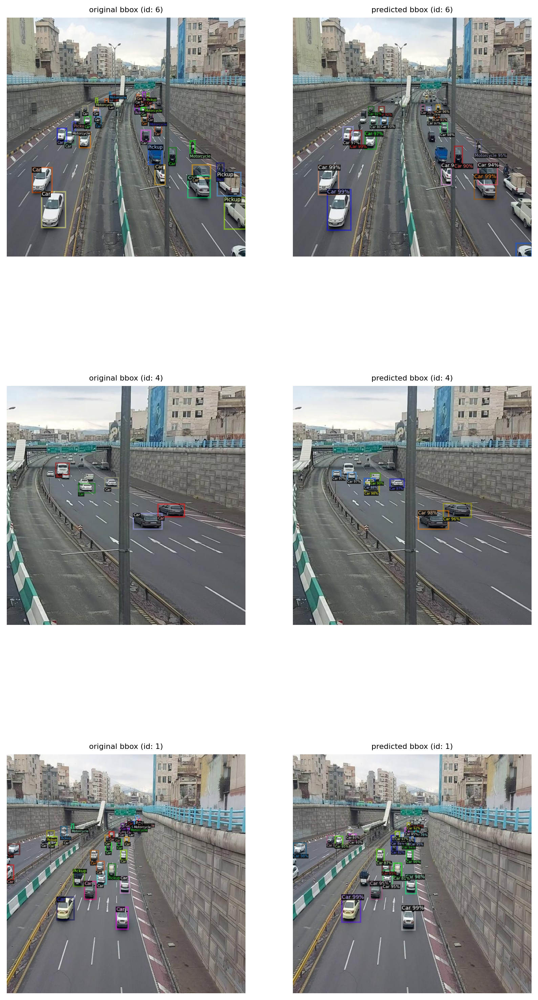

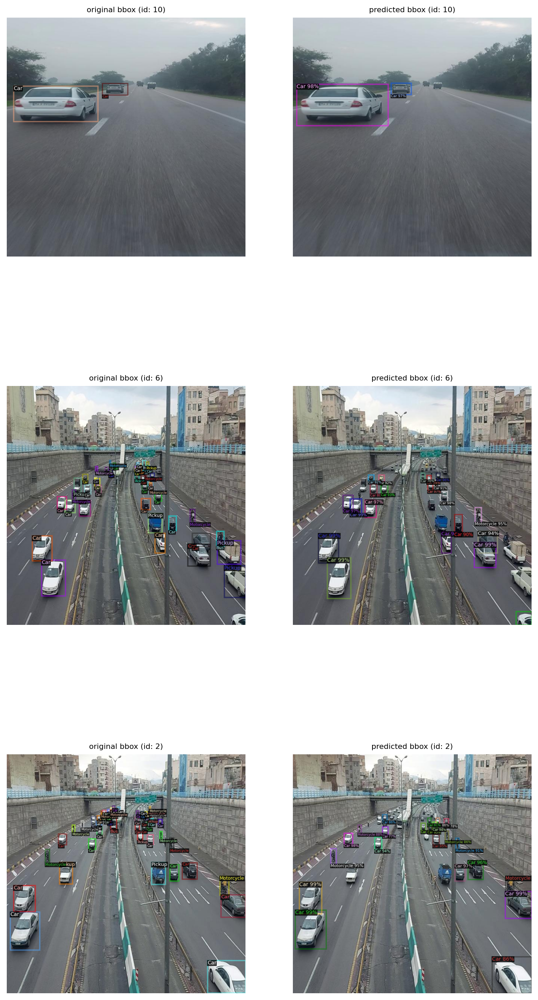

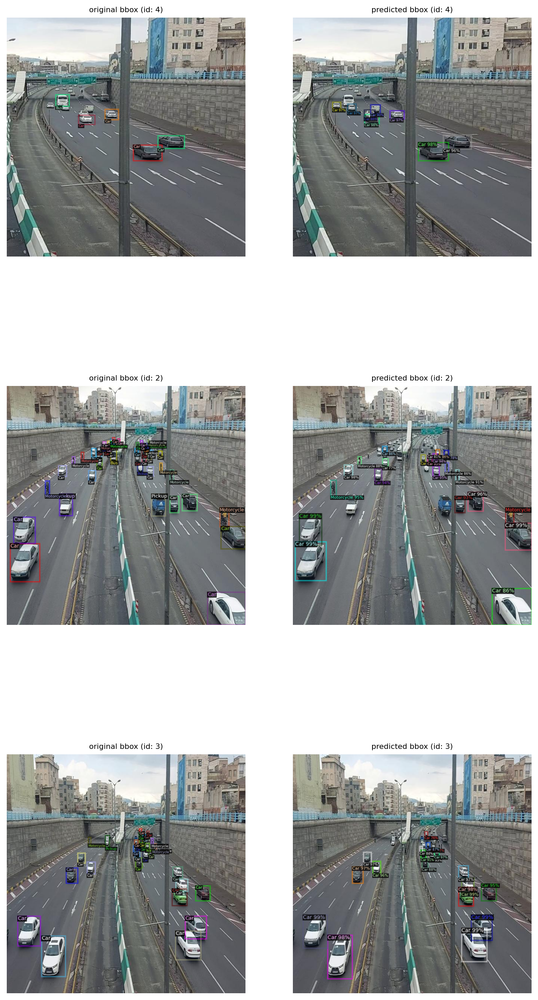

In [10]:
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 3, image_scale=1)
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 74, image_scale=1)
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 65, image_scale=1)